## Imports

In [1]:
from PIL import Image, ImageOps
import torch
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler


/Users/ibraheemalsaghier/anaconda3/envs/website/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
class MagicBrush():
    def __init__(self, weight="vinesmsuic/magicbrush-jul7"):
        device = "cuda" if torch.cuda.is_available() else "cpu"
        
        self.pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(
                        weight, 
                        torch_dtype=torch.float32 if device == "cpu" else torch.float16
                    ).to(device)
        self.pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(self.pipe.scheduler.config)
        
    def infer_one_image(self, src_image, instruct_prompt, seed):
        generator = torch.manual_seed(seed)
        image = self.pipe(instruct_prompt, image=src_image, num_inference_steps=20, image_guidance_scale=1.5, guidance_scale=7, generator=generator).images[0]
        return image

In [5]:
model = MagicBrush()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]/Users/ibraheemalsaghier/anaconda3/envs/website/lib/python3.11/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
An error occurred while trying to fetch /Users/ibraheemalsaghier/.cache/huggingface/hub/models--vinesmsuic--magicbrush-jul7/snapshots/d75a9f18439f67dbdc0ab113036f491ce2256c53/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /Users/ibraheemalsaghier/.cache/huggingface/hub/models--vinesmsuic--magicbrush-jul7/snapshots/d75a9f18439f67dbdc0ab113036f491ce2256c53/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...:  57%|█████▋    | 4/7 [00:01<00:00,  3.33it/s]An error occurred while trying to fetch /Users/ibraheemalsaghier/.cac

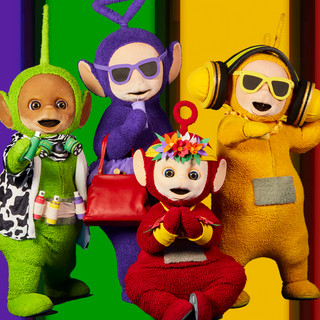

In [7]:
image_path = "./ab67616100005174370c266ab8087ee9de6631b0.jpeg"
image = Image.open(image_path)
image

In [8]:
prompt = "make them frown"

100%|██████████| 20/20 [01:21<00:00,  4.08s/it]


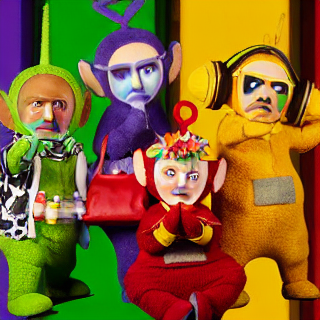

In [9]:
image_output = model.infer_one_image(image, prompt, 42)
image_output

100%|██████████| 20/20 [01:22<00:00,  4.10s/it]


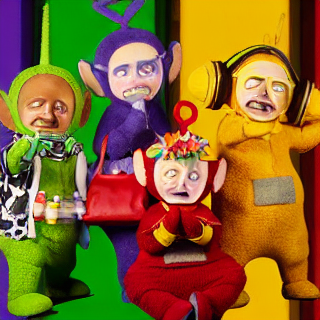

In [10]:
image_output = model.infer_one_image(image, "make them cry", 42)
image_output

100%|██████████| 20/20 [01:20<00:00,  4.03s/it]


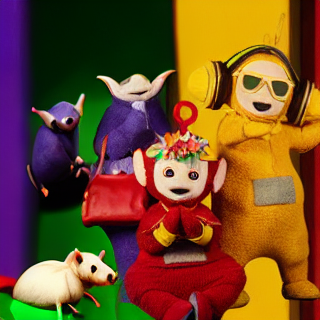

In [11]:
image_output = model.infer_one_image(image, "Add bats to the background", 42)
image_output

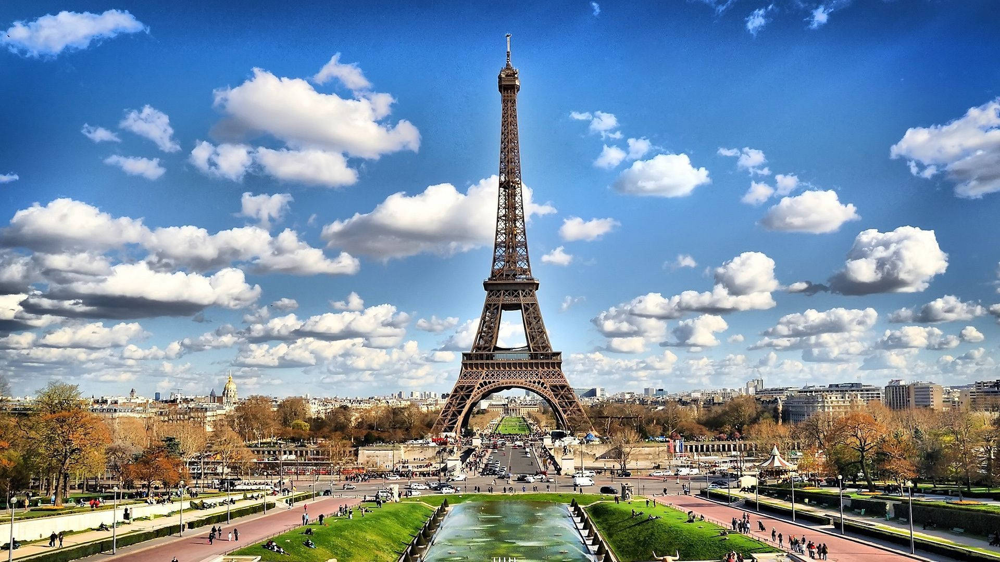

In [13]:
image2_path = "./77e2ef91-1cf.jpg"
image2 = Image.open(image2_path)
image2


100%|██████████| 20/20 [11:33:23<00:00, 2080.18s/it]   


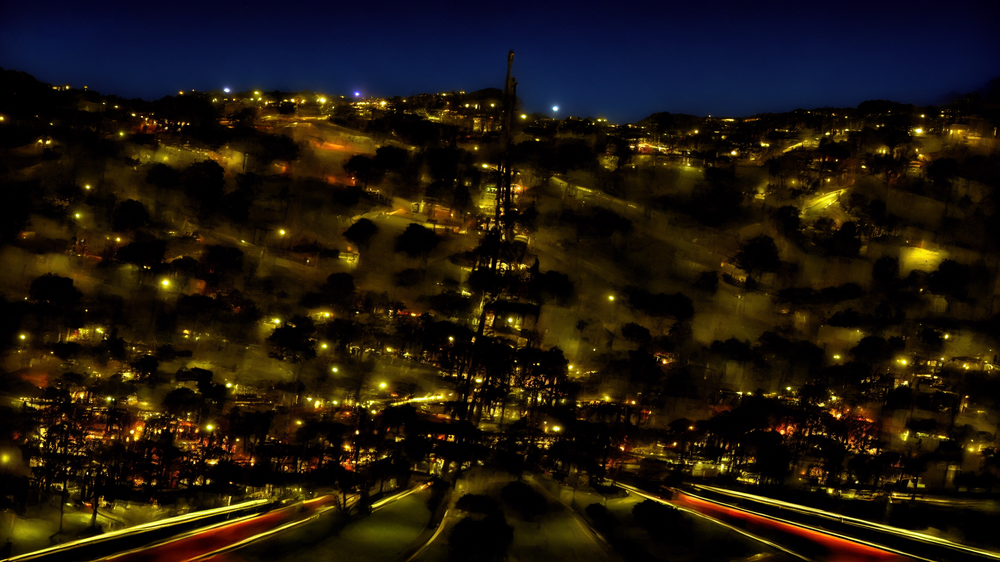

In [14]:
image2_output = model.infer_one_image(image2, "Turn it into night", 42)
image2_output
